In [1]:
import numpy as np
import pandas as pd
from glob import glob
import matplotlib.pyplot as plt
import folium
import branca
import json

In [2]:
#series is a pandas series with fips code index and values for map coloring
def county_map(series, map_tiles='cartodbpositron', color="YlOrRd", steps=6):
    
            
    series_max = series.quantile(.99)
    series_min = series.quantile(.01)
    

    def style_function(feature):
        map_series = series.get(int(feature['id'][-5:]), None)
        return {
            'fillOpacity': 0.5,
            'weight': 0,
            'fillColor': '#ffffff' if map_series is None 
            else getattr(branca.colormap.linear, color).scale(series_min, series_max)(map_series)
        }

    m = folium.Map(
    location=[48, -102],
    tiles=map_tiles,
    zoom_start=3
    )

    folium.TopoJson(
        open("data/maps/us_counties_20m_topo.json"),
        'objects.us_counties_20m',
        style_function=style_function
    ).add_to(m)

    return m

In [3]:
biz = pd.read_csv("data/interim/establishments.csv", encoding="latin-1")
biz["sum"] = biz.drop("year", axis=1).drop("geo_id", axis=1).sum(axis=1)

In [4]:
biz05 = biz[biz["year"] == 2005].drop("year", 1).set_index("geo_id")
biz07 = biz[biz["year"] == 2007].drop("year", 1).set_index("geo_id")
biz11 = biz[biz["year"] == 2011].drop("year", 1).set_index("geo_id")
biz15 = biz[biz["year"] == 2015].drop("year", 1).set_index("geo_id")

In [5]:
biz_compound = ((biz15["sum"] / biz05["sum"]) ** (1/10) - 1) * 100
us_recovery = ((biz15["sum"] / biz11["sum"]) ** (1/4) - 1) * 100
recession = ((biz11["sum"] / biz07["sum"]) ** (1/4) - 1) * 100

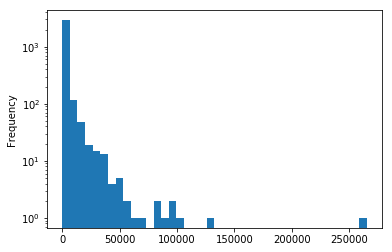

In [6]:
biz[biz["year"] == 2015]["sum"].plot(kind="hist", bins=40, log=True)
plt.show()

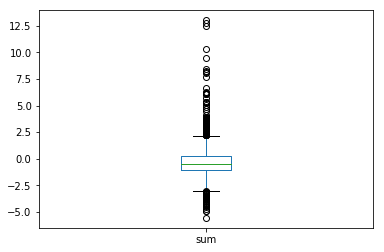

In [7]:
biz_compound.plot(kind="box")
plt.show()

In [8]:
county_map(biz15["sum"], steps=10)

In [9]:
county_map((-1 * recession[recession < 0].fillna(0)), color="OrRd")

In [10]:
county_map(us_recovery[us_recovery > 0].fillna(0), color="YlGn")

In [11]:
national05 = biz[biz["year"] == 2005].groupby("year").sum().drop("geo_id", 1).drop("sum", 1)
national15 = biz[biz["year"] == 2015].groupby("year").sum().drop("geo_id", 1).drop("sum", 1)

In [12]:
national05

,Accommodation and food services,Administrative and support and waste management and remediation services,"Agriculture, forestry, fishing and hunting","Arts, entertainment, and recreation",Construction,Educational services,Finance and insurance,Health care and social assistance,Industries not classified,Information,Management of companies and enterprises,Manufacturing,"Mining, quarrying, and oil and gas extraction",Other services (except public administration),"Professional, scientific, and technical services",Real estate and rental and leasing,Retail trade,Transportation and warehousing,Utilities,Wholesale trade
year,,,,,,,,,,,,,,,,,,,,
2005,603425,368360,24084,121775,787553,80439,474208,746453,23987,140961,47424,333450,23313,740003,825179,370624,1123144,211058,17300,428010


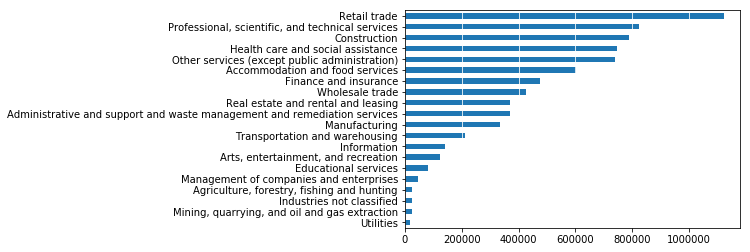

In [13]:
national05.loc[2005].sort_values().plot(kind="barh")

plt.grid(color="w", axis="x")
plt.show()

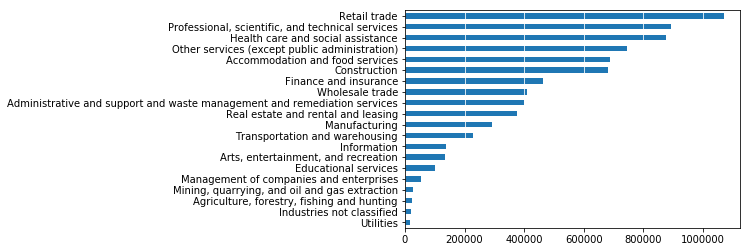

In [14]:
national15.loc[2015].sort_values().plot(kind="barh")

plt.grid(color="w", axis="x")
plt.show()

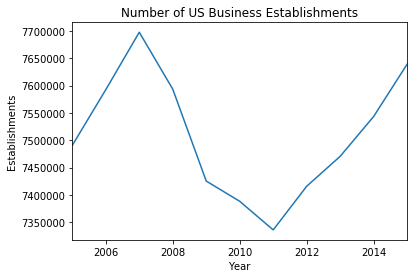

In [15]:
biz.groupby("year").sum()["sum"].plot()
plt.ylabel('Establishments')
plt.xlabel('Year')
plt.title('Number of US Business Establishments')

plt.show()

In [16]:
employees = pd.read_csv("data/interim/employees.csv", encoding="latin-1")
employees["sum"] = employees.drop("year", axis=1).drop("geo_id", axis=1).sum(axis=1)

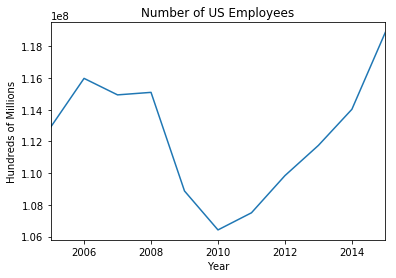

In [17]:
employees.groupby("year").sum()["sum"].plot()
plt.ylabel('Hundreds of Millions')
plt.xlabel('Year')
plt.title('Number of US Employees')

plt.show()

In [18]:
biz.groupby("year").sum()["sum"][2015]

7639086

In [19]:
exemptions_in = pd.read_csv("data/interim/exemptions_inflow.csv", encoding="latin-1")
exemptions_in["sum"] = exemptions_in.drop("year", axis=1).drop("geo_id", axis=1).sum(axis=1)

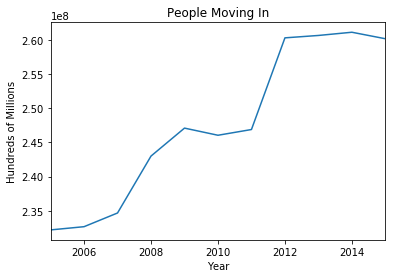

In [20]:
exemptions_in.groupby("year").sum()["sum"].plot()

plt.ylabel('Hundreds of Millions')
plt.xlabel('Year')
plt.title('People Moving In')

plt.show()

In [21]:
exemptions_out = pd.read_csv("data/interim/exemptions_outflow.csv", encoding="latin-1")
exemptions_out["sum"] = exemptions_out.drop("year", axis=1).drop("geo_id", axis=1).sum(axis=1)

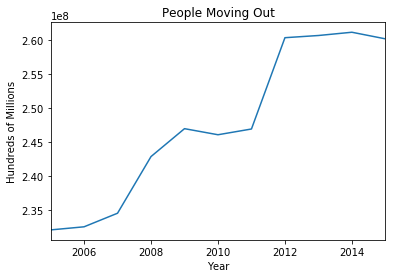

In [22]:
exemptions_out.groupby("year").sum()["sum"].plot()
plt.ylabel('Hundreds of Millions')
plt.xlabel('Year')
plt.title('People Moving Out')

plt.show()

In [23]:
returns_out = pd.read_csv("data/interim/returns_outflow.csv", encoding="latin-1")
returns_out["sum"] = returns_out.drop("year", axis=1).drop("geo_id", axis=1).sum(axis=1)

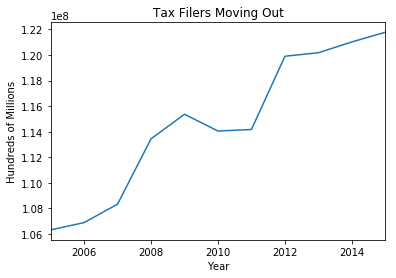

In [24]:
returns_out.groupby("year").sum()["sum"].plot()
plt.ylabel('Hundreds of Millions')
plt.xlabel('Year')
plt.title('Tax Filers Moving Out')

plt.show()

In [25]:
returns_in = pd.read_csv("data/interim/returns_inflow.csv", encoding="latin-1")
returns_in["sum"] = returns_in.drop("year", axis=1).drop("geo_id", axis=1).sum(axis=1)

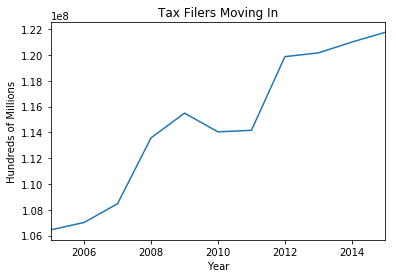

In [26]:
returns_in.groupby("year").sum()["sum"].plot()
plt.ylabel('Hundreds of Millions')
plt.xlabel('Year')
plt.title('Tax Filers Moving In')

plt.show()

In [27]:
exemptions_in = exemptions_in.drop("sum", axis=1).set_index(["geo_id","year"])
exemptions_in["home"] = exemptions_in.max(axis=1)
exemptions_in["total"] = exemptions_in.drop("home", axis=1).sum(axis=1)
exemptions_in = exemptions_in[["home","total"]]
exemptions_in["newbies"] = exemptions_in["total"] - exemptions_in["home"]
exemptions_in["newpercent"] = exemptions_in["newbies"] / exemptions_in["total"]

In [28]:
fresh2015 = exemptions_in.reset_index("year")
fresh2015 = fresh2015[fresh2015["year"] == 2015]

In [29]:
fresh2015 = fresh2015.reset_index()
fresh2015["geo_id"] = fresh2015["geo_id"].astype(int)
fresh2015 = fresh2015.set_index("geo_id")

In [30]:
county_map(fresh2015["newpercent"])

In [31]:
nationalin = exemptions_in.groupby("year").sum()

In [32]:
nationalin["newpercent"] = nationalin["newbies"] / nationalin["total"]

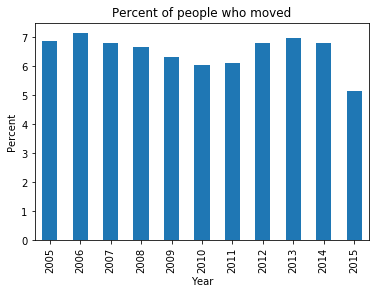

In [33]:
(nationalin["newpercent"]*100).plot(kind="bar")
plt.ylabel('Percent')
plt.xlabel('Year')
plt.title('Percent of people who moved')

plt.show()

In [34]:
exemptions_out = exemptions_out.drop("sum", axis=1).set_index(["geo_id","year"])
exemptions_out["home"] = exemptions_out.max(axis=1)
exemptions_out["total"] = exemptions_out.drop("home", axis=1).sum(axis=1)
exemptions_out = exemptions_out[["home","total"]]
exemptions_out["outies"] = exemptions_out["total"] - exemptions_out["home"]
exemptions_out["outpercent"] = exemptions_out["outies"] / exemptions_out["total"]

In [35]:
outies2015 = exemptions_out.reset_index("year")
outies2015 = outies2015[outies2015["year"] == 2015]

In [36]:
outies2015 = outies2015.reset_index()
outies2015["geo_id"] = outies2015["geo_id"].astype(int)
outies2015 = outies2015.set_index("geo_id")

In [37]:
county_map(outies2015["outpercent"])

In [38]:
county_map(fresh2015["newpercent"])

In [39]:
county_map(fresh2015["newpercent"] - outies2015["outpercent"], color="RdYlGn")

In [40]:
county_map(fresh2015["newbies"] - outies2015["outies"], color="RdYlGn")

In [41]:
poploss = (outies2015["outpercent"] - fresh2015["newpercent"])[(outies2015["outpercent"] - fresh2015["newpercent"]) > 0]
popgain = (outies2015["outpercent"] - fresh2015["newpercent"])[(outies2015["outpercent"] - fresh2015["newpercent"]) < 0]
popchange = poploss.append(popgain)

In [42]:
county_map(popchange, color="RdYlGn")

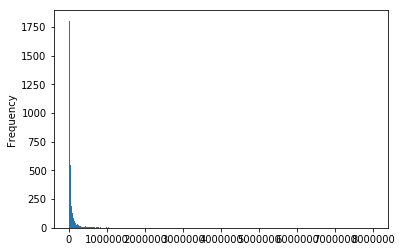

In [43]:
fresh2015["total"].plot(kind="hist", bins=300)
plt.show()

In [44]:
b14 = biz[biz["year"] == 2014].set_index("geo_id")
b15 = biz[biz["year"] == 2015].set_index("geo_id")
bizgrowth15 = (b15["sum"] - b14["sum"]) / b14["sum"]

In [45]:
county_map(bizgrowth15, color="RdYlGn")

In [46]:
county_map(biz_compound, color="RdYlGn")

In [47]:
b15["growth"]=b15["sum"] - b14["sum"]
bp2015 = b15.reset_index().merge(fresh2015.reset_index(), left_on="geo_id", right_on="geo_id", suffixes=('_x', '_y'), how="left").fillna(0)
bp2015["bgrowthpercent"] = bp2015["growth"] / bp2015["sum"]

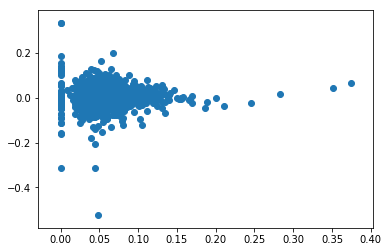

In [48]:
plt.scatter(bp2015["newpercent"], bp2015["bgrowthpercent"])
plt.show()

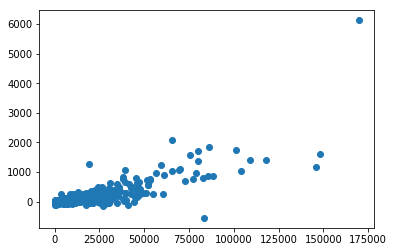

In [49]:
plt.scatter(bp2015["newbies"], bp2015["growth"])
plt.show()

In [50]:
flow2015 = outies2015.reset_index().merge(fresh2015.reset_index(), left_on="geo_id", right_on="geo_id", suffixes=('_x', '_y'))
flow2015["netflow"] = flow2015["total_x"] - flow2015["total_y"]
bp2015 = b15.reset_index().merge(flow2015.reset_index(), left_on="geo_id", right_on="geo_id", suffixes=('_x', '_y'), how="left").fillna(0)

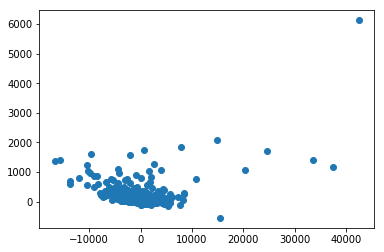

In [51]:
plt.scatter(bp2015["netflow"], bp2015["growth"])
plt.show()

In [52]:
bp2015["netflowpercent"] = bp2015["netflow"] / bp2015["total_y"]

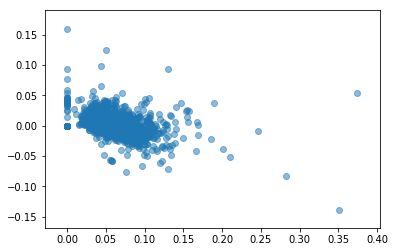

In [53]:
plt.scatter(bp2015["newpercent"], bp2015["netflowpercent"], alpha=0.5)
plt.show()

In [54]:
exemptions_in = exemptions_in.reset_index()
in2005 = exemptions_in[exemptions_in["year"] == 2005]
in2015 = exemptions_in[exemptions_in["year"] == 2015]
in201520015 = in2015.merge(in2005, left_on="geo_id", right_on="geo_id")
flow0515 = in201520015.loc[:, ["geo_id","total_x","total_y"]]
flow0515.columns=["geo_id","2015","2005"]
flow0515["popchange"] = flow0515["2015"] - flow0515["2005"]
flow0515 = flow0515.set_index("geo_id")

In [55]:
county_map(flow0515["popchange"], color="RdYlGn")

In [56]:
biz201520015 = biz15.reset_index().merge(biz05.reset_index(), left_on="geo_id", right_on="geo_id")
biz201520015 = biz201520015.loc[:, ["geo_id","sum_x","sum_y"]]
biz201520015["bizchange"] = biz201520015["sum_x"] - biz201520015["sum_y"]
biz201520015 = biz201520015.set_index("geo_id")

In [57]:
county_map(biz201520015["bizchange"])

In [58]:
bp0515 = biz201520015.reset_index().merge(flow0515.reset_index(), left_on="geo_id", right_on="geo_id", how="left").fillna(0)

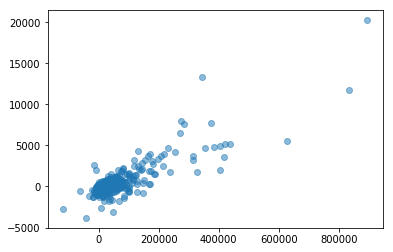

In [59]:
plt.scatter(bp0515["popchange"], bp0515["bizchange"], alpha=0.5)
plt.show()